In [1]:
TRAIN = '/kaggle/input/datasets/miguel000/sports/sportimages/sportimages'

Unfortunately our test folder doesn't have enough images in it to be interesting, so we'll need to split our data into training and test splits.

In [2]:
ls /kaggle/input/datasets/miguel000/sports/test/test

deporte1.jpg   imagen13.jpg  imagen18.jpg  imagen26.jpg  imagen7.jpg
deporte2.jpg   imagen14.jpg  imagen20.jpg  imagen3.jpg   imagen8.jpg
iamgen21.jpg   imagen15.jpg  imagen22.jpg  imagen4.jpg   imagen9.jpeg
imagen11.jpg   imagen16.jpg  imagen23.jpg  imagen5.jpg
imagen12.jpeg  imagen17.jpg  imagen25.jpg  imagen6.jpg


We want to use ResNeXt image embeddings for EDA and classification, so let's add some code to get them for us.

In [3]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import numpy as np


DEVICE = torch.device('cpu')
OUTPUT_SIZE = 2048

model = models.resnext50_32x4d(weights=models.ResNeXt50_32X4D_Weights.IMAGENET1K_V2)

extraction_layer = model._modules.get('avgpool')
model.to(DEVICE)
model.eval()

scaler = transforms.Resize((224, 224))
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
to_tensor = transforms.ToTensor()

def get_vec(arg, model, extraction_layer):
    image = normalize(to_tensor(scaler(arg))).unsqueeze(0).to(DEVICE)
    result = torch.zeros(1, OUTPUT_SIZE, 1, 1)
    def copy_data(m, i, o):
        result.copy_(o.data)
    hooked = extraction_layer.register_forward_hook(copy_data)
    with torch.no_grad():
        model(image)
    hooked.remove()
    return result

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-1a0047aa.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-1a0047aa.pth


100%|██████████| 95.8M/95.8M [00:03<00:00, 30.5MB/s]


Let's load up our data; starting with a modest sample.

In [4]:
import arrow
import base64
import pandas as pd
import tqdm

from glob import iglob
from io import BytesIO
from os.path import basename
from os.path import isdir
from PIL import Image


N = 200
THUMBNAIL_SIZE = (64, 64)

def embed(model, filename: str):
    with Image.open(fp=filename, mode='r') as image:
        return get_vec(arg=image.convert('RGB'), model=model, extraction_layer=extraction_layer).numpy().reshape(OUTPUT_SIZE,)


# https://stackoverflow.com/a/952952
def flatten(arg):
    return [x for xs in arg for x in xs]

def png(filename: str) -> str:
    with Image.open(fp=filename, mode='r') as image:
        buffer = BytesIO()
        # our images are pretty big; let's shrink the hover images to thumbnail size
        image.resize(size=THUMBNAIL_SIZE).convert('RGBA').save(buffer, format='png')
        return 'data:image/png;base64,' + base64.b64encode(buffer.getvalue()).decode()

def get_picture_from_glob(arg: str, tag: str,) -> list:
    time_get = arrow.now()
    input_files = list(iglob(pathname=arg))
    input_files = [item for item in input_files if item.endswith('.jpg')]
    result = [pd.Series(data=[tag, basename(input_file), embed(model=model, filename=input_file), png(filename=input_file)],
                        index=['tag', 'name', 'value', 'png'] )
        for index, input_file in enumerate(tqdm.tqdm(input_files[:N]))]
    print('encoded {} rows of {}  in {}'.format(len(result), tag, arrow.now() - time_get))
    return result

time_start = arrow.now()
train_dict = {basename(folder) : folder + '/*.*' for folder in iglob(TRAIN + '/*') if isdir(folder) }
train_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, tag=key) for key, value in train_dict.items()]))
print('done in {}'.format(arrow.now() - time_start))

100%|██████████| 200/200 [00:32<00:00,  6.09it/s]


encoded 200 rows of beisball  in 0:00:32.985937


100%|██████████| 200/200 [00:31<00:00,  6.29it/s]


encoded 200 rows of americano  in 0:00:31.942644


100%|██████████| 200/200 [00:31<00:00,  6.26it/s]


encoded 200 rows of futbol  in 0:00:32.073632


100%|██████████| 200/200 [00:32<00:00,  6.15it/s]


encoded 200 rows of golf  in 0:00:32.669155


100%|██████████| 200/200 [00:31<00:00,  6.33it/s]


encoded 200 rows of f1  in 0:00:31.686394


100%|██████████| 200/200 [00:31<00:00,  6.34it/s]


encoded 200 rows of ciclismo  in 0:00:31.683572


100%|██████████| 200/200 [00:33<00:00,  6.04it/s]


encoded 200 rows of tenis  in 0:00:33.276384


100%|██████████| 200/200 [00:33<00:00,  5.97it/s]


encoded 200 rows of natacion  in 0:00:33.623836


100%|██████████| 200/200 [00:32<00:00,  6.15it/s]


encoded 200 rows of basket  in 0:00:32.658242


100%|██████████| 200/200 [00:32<00:00,  6.13it/s]


encoded 200 rows of boxeo  in 0:00:32.747554
done in 0:05:25.567229


In [5]:
train_df['tag'].value_counts(normalize=True).to_frame().T

tag,beisball,americano,futbol,golf,f1,ciclismo,tenis,natacion,basket,boxeo
proportion,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1


Are our classes balanced? If we take a balanced sample they are.

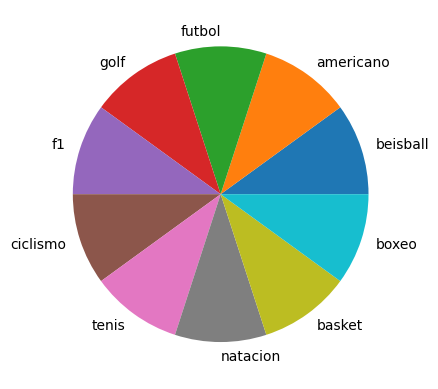

In [6]:
import matplotlib.pyplot as plt

train_df['tag'].value_counts(normalize=False).to_frame().plot.pie(y='count')
plt.ylabel('')
plt.legend().remove()
plt.show()

Next let's use TSNE to add x/y coordinates based on our image embeddings.

In [7]:
from sklearn.manifold import TSNE

train_reducer = TSNE(random_state=2026, verbose=True, n_jobs=1, perplexity=20.0, init='pca')
train_df[['x', 'y']] = train_reducer.fit_transform(X=train_df['value'].apply(func=pd.Series))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 2000 samples in 0.010s...
[t-SNE] Computed neighbors for 2000 samples in 0.551s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2000
[t-SNE] Computed conditional probabilities for sample 2000 / 2000
[t-SNE] Mean sigma: 4.578677
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.801453
[t-SNE] KL divergence after 1000 iterations: 0.862848


Let's plot.

In [8]:
from bokeh.models import ColumnDataSource
from bokeh.models import HoverTool

from bokeh.plotting import figure
from bokeh.plotting import output_notebook
from bokeh.plotting import show
from bokeh.palettes import Turbo256
from bokeh.transform import factor_cmap

output_notebook()

datasource = ColumnDataSource(train_df[['png', 'tag', 'x', 'y']].sample(n=min(len(train_df) - 1, 10000)))
factor_count = max(train_df['tag'].nunique(), 3)
indices = np.linspace(0, len(Turbo256)-1, factor_count, dtype=int)
palette = [Turbo256[index] for index in indices]
mapper = factor_cmap(field_name = 'tag', palette=palette, factors=train_df['tag'].unique().tolist(), start=0, end=factor_count-1, )

plot_figure = figure(title='TSNE projection: sports', width=1000, height=800, tools=('pan, wheel_zoom, reset'))

plot_figure.add_tools(HoverTool(tooltips="""
<div>
    <div>
        <img src='@png' style='float: left; margin: 5px 5px 5px 5px'/>
    </div>
    <div>
        <span style='font-size: 18px'>@tag</span>
    </div>
</div>
"""))

plot_figure.scatter(x='x', y='y', source=datasource, line_alpha=0.6, fill_alpha=0.6, size=8, color=mapper)
show(plot_figure)

Loading BokehJS ...

What do we see? We see that our data has been augmented, and that's going to overstate our model accuracy. We also see 
Let's build a model and see what we get.

In [9]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(train_df['value'].apply(pd.Series), train_df['tag'], test_size=0.25, random_state=2026, stratify=train_df['tag'])
logreg = LogisticRegression(max_iter=10000, tol=1e-12).fit(X_train, y_train)
print('model fit in {} iterations'.format(logreg.n_iter_[0]))
print('accuracy: {:5.4f}'.format(accuracy_score(y_true=y_test, y_pred=logreg.predict(X=X_test))))
print('f1: {:5.4f}'.format(f1_score(average='weighted', y_true=y_test, y_pred=logreg.predict(X=X_test))))
print(classification_report(y_true=y_test, y_pred=logreg.predict(X=X_test), zero_division=0.0))

model fit in 906 iterations
accuracy: 0.9300
f1: 0.9301
              precision    recall  f1-score   support

   americano       0.80      0.86      0.83        50
      basket       0.88      0.88      0.88        50
    beisball       0.96      0.96      0.96        50
       boxeo       0.94      0.98      0.96        50
    ciclismo       0.98      0.98      0.98        50
          f1       0.94      0.90      0.92        50
      futbol       0.96      0.90      0.93        50
        golf       0.91      0.86      0.89        50
    natacion       0.98      1.00      0.99        50
       tenis       0.96      0.98      0.97        50

    accuracy                           0.93       500
   macro avg       0.93      0.93      0.93       500
weighted avg       0.93      0.93      0.93       500



An f1 score greater than 0.9 seems pretty good, but as we noted above above this is probably due to a combination of in-sample testing and data augmentation. Let's look at our model probabilities.

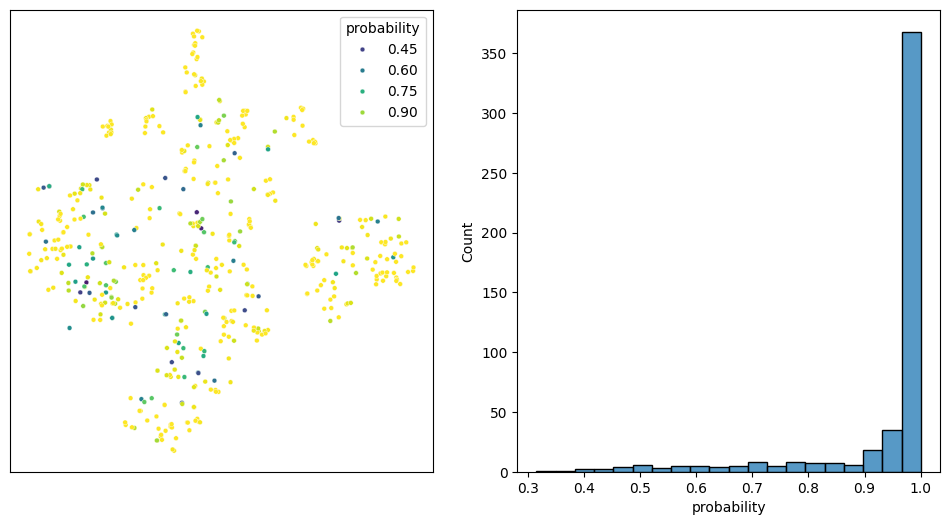

In [10]:
import warnings
from seaborn import histplot
from seaborn import scatterplot

warnings.filterwarnings('ignore', category=FutureWarning, module='seaborn')

plot_df = train_df.iloc[X_test.index][['x', 'y']].copy()
plot_df['probability'] = np.max(logreg.predict_proba(X=X_test), axis=1)

fig, ax = plt.subplots(ncols=2, figsize=(12, 6))
scatterplot(ax=ax[0], data=plot_df, x='x', y='y', hue='probability', palette='viridis', s=12)
ax[0].set(xlabel=None) 
ax[0].set(ylabel=None)
ax[0].set(xticklabels=[])
ax[0].set(yticklabels=[])
ax[0].tick_params(axis='both', which='both', length=0)
histplot(ax=ax[1], data=plot_df, x='probability', bins=20)
fig.show()

Not surprisingly, our model probabilities are generally pretty high, and our lower model probabilities arise where we have mixing in our TSNE clusters.